In [0]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [0]:
from fastai.vision import *
from fastai.metrics import error_rate

In [0]:
bs = 64
# bs = 16   # uncomment this line if you run out of memory even after clicking kernel restart

In [0]:
path = Path('/content/drive/My Drive/')

In [0]:
path

PosixPath('/content/drive/My Drive')

In [0]:
path_imgs=path/'imgs'

In [0]:
path_imgs.mkdir(parents=True, exist_ok=True)
path_imgs

PosixPath('/content/drive/My Drive/imgs')

In [0]:
src = (ImageList.from_folder(path_imgs,recurse=True)
               .split_by_rand_pct(valid_pct=.2))

In [0]:
src

ItemLists;

Train: ImageList (217 items)
Image (3, 500, 359),Image (3, 227, 500),Image (3, 208, 500),Image (3, 324, 500),Image (3, 219, 500)
Path: /content/drive/My Drive/imgs;

Valid: ImageList (54 items)
Image (3, 960, 1280),Image (3, 245, 500),Image (3, 183, 275),Image (3, 500, 750),Image (3, 212, 500)
Path: /content/drive/My Drive/imgs;

Test: None

In [0]:

src.train.items[0]

PosixPath('/content/drive/My Drive/imgs/usd/50/00000IMG_00000_BURST20190730233032910_COVER.jpg')

In [0]:
for i in range(200):
    print(src.train.items[i])

/content/drive/My Drive/imgs/usd/50/00000IMG_00000_BURST20190730233032910_COVER.jpg
/content/drive/My Drive/imgs/usd/50/IMG_20190730_232652.jpg
/content/drive/My Drive/imgs/usd/50/IMG_20190730_232536.jpg
/content/drive/My Drive/imgs/usd/50/Screen Shot 2019-07-31 at 4.38.11 PM.png
/content/drive/My Drive/imgs/usd/50/Screen Shot 2019-07-31 at 4.38.19 PM.png
/content/drive/My Drive/imgs/usd/50/Screen Shot 2019-07-31 at 4.36.39 PM.png
/content/drive/My Drive/imgs/usd/50/IMG_20190730_232729.jpg
/content/drive/My Drive/imgs/usd/50/Screen Shot 2019-07-31 at 4.38.31 PM.png
/content/drive/My Drive/imgs/usd/50/Screen Shot 2019-07-31 at 4.39.08 PM.png
/content/drive/My Drive/imgs/usd/50/Screen Shot 2019-07-31 at 4.39.14 PM.png
/content/drive/My Drive/imgs/usd/50/Screen Shot 2019-07-31 at 4.40.29 PM.png
/content/drive/My Drive/imgs/usd/50/Screen Shot 2019-07-31 at 4.40.36 PM.png
/content/drive/My Drive/imgs/usd/50/00100lPORTRAIT_00100_BURST20190730233028521_COVER.jpg
/content/drive/My Drive/imgs/u

In [0]:
func=lambda i: str(i.parent.relative_to(path_imgs) )

In [0]:
func

<function __main__.<lambda>>

In [0]:
#multi class
func=lambda i: (i.parent.relative_to(path_imgs).parts )
func(src.train.items[0])

('usd', '50')

In [0]:
func

<function __main__.<lambda>>

In [0]:
ll = src.label_from_func(func); ll

LabelLists;

Train: LabelList (217 items)
x: ImageList
Image (3, 500, 359),Image (3, 227, 500),Image (3, 208, 500),Image (3, 324, 500),Image (3, 219, 500)
y: MultiCategoryList
usd;50,usd;50,usd;50,usd;50,usd;50
Path: /content/drive/My Drive/imgs;

Valid: LabelList (54 items)
x: ImageList
Image (3, 960, 1280),Image (3, 245, 500),Image (3, 183, 275),Image (3, 500, 750),Image (3, 212, 500)
y: MultiCategoryList
inr;200,usd;100,inr;200,inr;100,usd;50
Path: /content/drive/My Drive/imgs;

Test: None

In [0]:
tfms = get_transforms(do_flip=False,flip_vert=False, 
                      max_zoom=0.55)

In [0]:
def get_data(size,bs):
    size=int(size)
    bs=int(bs)
    data = (ll.transform(tfms, size=size)
        .databunch(bs=bs) #for CPU only add ,num_workers=0
        .normalize(imagenet_stats))
    return data

In [0]:
#let bs be 128 scale it to 256 later
size=128

In [0]:
bs=64

In [0]:
data=get_data(size,bs)

In [0]:
data

ImageDataBunch;

Train: LabelList (217 items)
x: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: MultiCategoryList
usd;50,usd;50,usd;50,usd;50,usd;50
Path: /content/drive/My Drive/imgs;

Valid: LabelList (54 items)
x: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: MultiCategoryList
inr;200,usd;100,inr;200,inr;100,usd;50
Path: /content/drive/My Drive/imgs;

Test: None

In [0]:
data.classes

['1', '10', '100', '20', '200', '5', '50', '500', 'inr', 'usd']

In [0]:
data.c

10

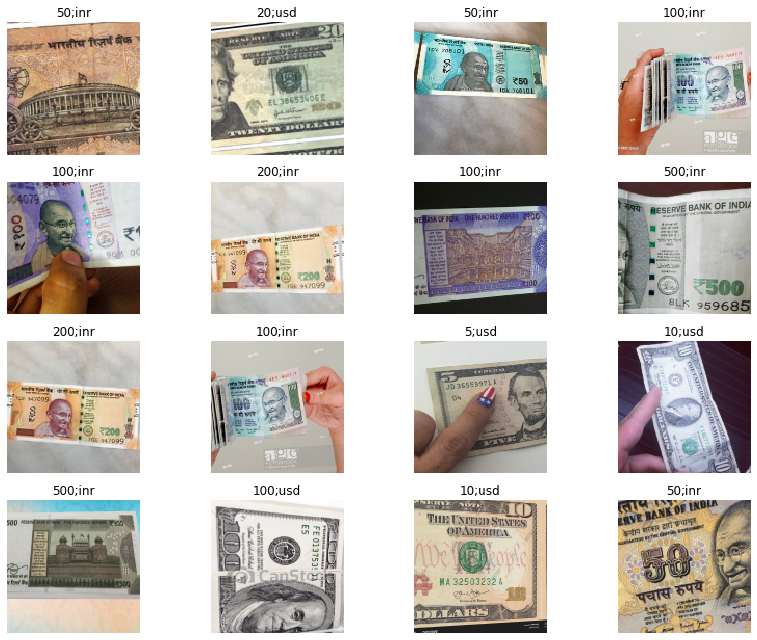

In [0]:
data.show_batch(rows=4, figsize=(12,9))

In [0]:
#that looks better

In [0]:
arch = models.resnet34

In [0]:
#cannot compromise system for accuracy yet

In [0]:
acc_02 = partial(accuracy_thresh, thresh=0.2)
f_score = partial(fbeta, thresh=0.2)
#multiclass
learn = cnn_learner(data, arch, metrics=[acc_02, f_score])
#single class
#learn = cnn_learner(data, arch, metrics=[accuracy])

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth


In [0]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


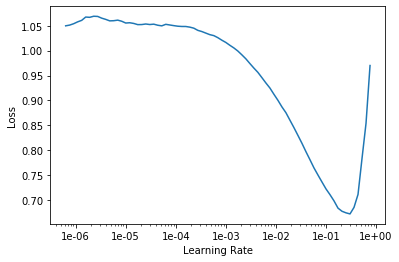

In [0]:
learn.recorder.plot()

In [0]:
#fitting head
lr=1e-2

In [0]:
learn.save('stage-1-colab-rn34')

epoch,train_loss,valid_loss,accuracy_thresh,fbeta,time
0,1.044890,0.852369,0.318182,0.529471,01:01
1,0.929419,0.601054,0.525000,0.645415,00:58
2,0.833569,0.626878,0.597727,0.651512,00:53
3,0.717779,0.448426,0.738636,0.671875,00:52
4,0.615079,0.332385,0.815909,0.668216,00:55
5,0.543736,0.307249,0.840909,0.744980,01:01
6,0.490806,0.287861,0.856818,0.749598,01:01
7,0.447199,0.270691,0.865909,0.762110,01:02
8,0.417768,0.265829,0.868182,0.764405,00:57
9,0.391206,0.277592,0.859091,0.746843,00:50


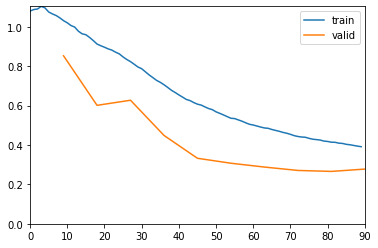

In [0]:
learn.fit_one_cycle(10, slice(lr),callbacks=ShowGraph(learn))

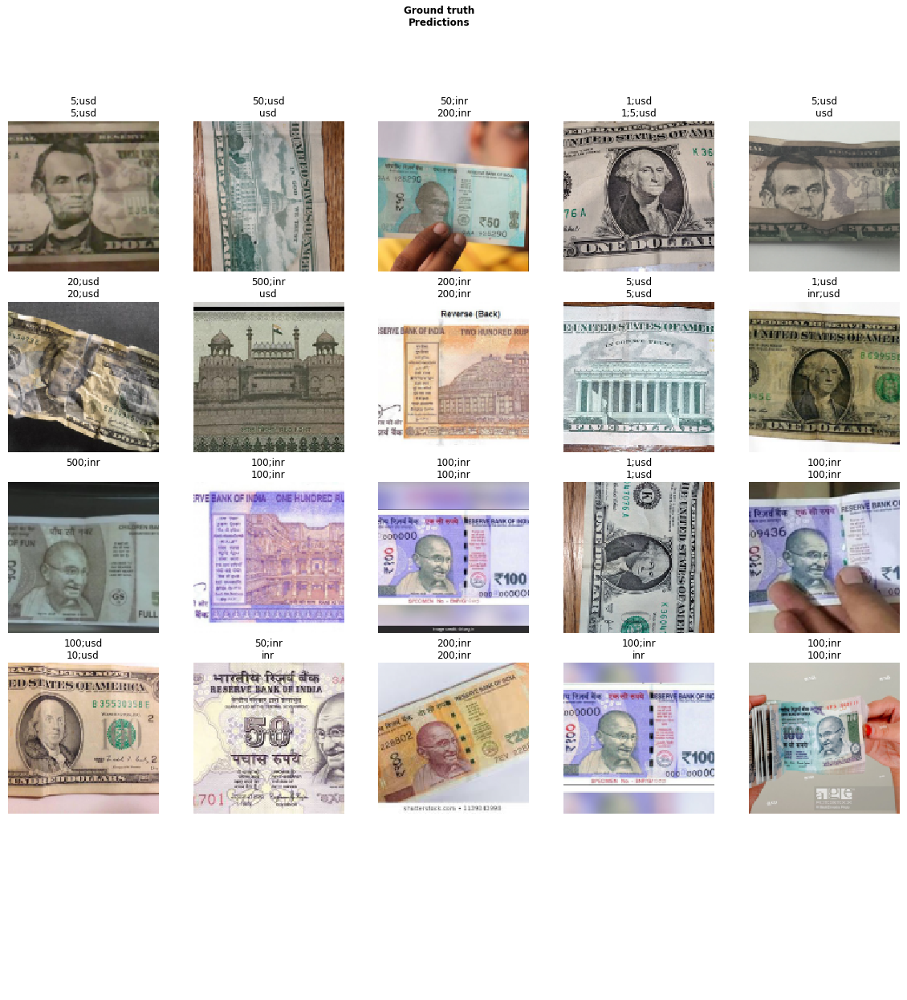

In [0]:
learn.show_results()

In [0]:
interp = ClassificationInterpretation.from_learner(learn)

In [0]:
learn.save('stage-1')

In [0]:

losses,idxs = interp.top_losses()

len(data.valid_ds)==len(losses)==len(idxs)

False

In [0]:
interp = ClassificationInterpretation.from_learner(learn)

In [0]:
help(interp.plot_top_losses)

Help on method _cl_int_plot_top_losses in module fastai.vision.learner:

_cl_int_plot_top_losses(k, largest=True, figsize=(12, 12), heatmap: bool = False, heatmap_thresh: int = 16, alpha: float = 0.6, cmap: str = 'magma', show_text: bool = True, return_fig: bool = None) -> Union[matplotlib.figure.Figure, NoneType] method of fastai.train.ClassificationInterpretation instance
    Show images in `top_losses` along with their prediction, actual, loss, and probability of actual class.



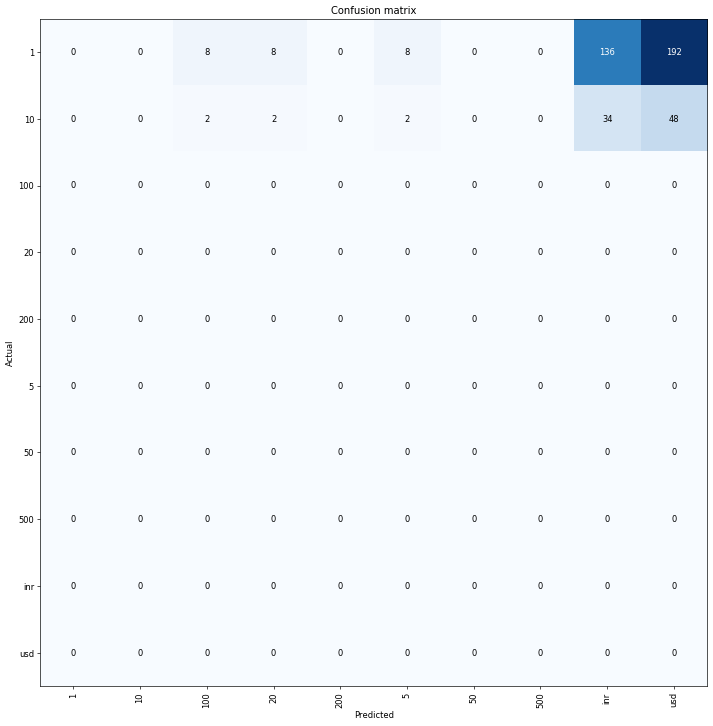

In [0]:
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [0]:
interp.most_confused(min_val=2)

[('1', 'usd', 192),
 ('1', 'inr', 136),
 ('10', 'usd', 48),
 ('10', 'inr', 34),
 ('1', '100', 8),
 ('1', '20', 8),
 ('1', '5', 8),
 ('10', '100', 2),
 ('10', '20', 2),
 ('10', '5', 2)]

In [0]:
learn.load('stage-1');

In [0]:
interp = ClassificationInterpretation.from_learner(learn)

In [0]:
losses,idxs = interp.top_losses()

len(data.valid_ds)==len(losses)==len(idxs)

False

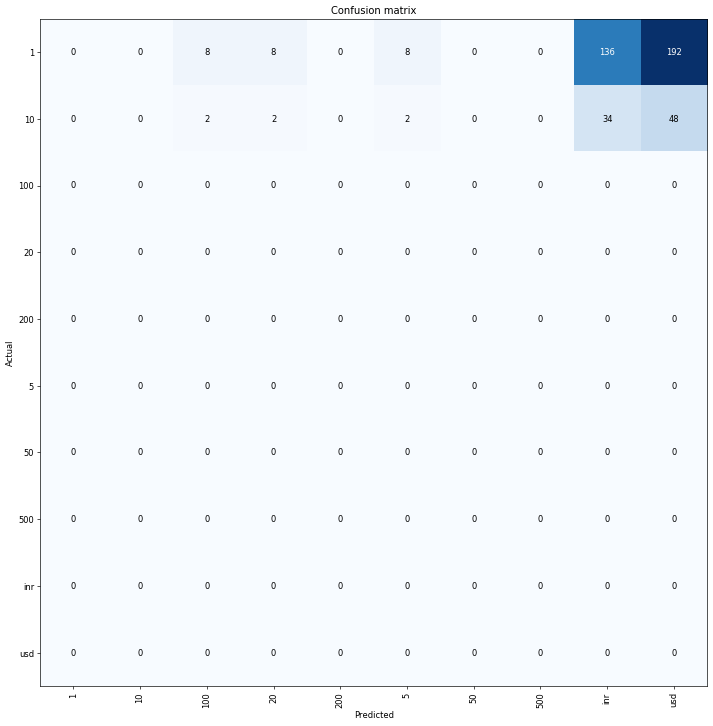

In [0]:
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [0]:
cleaner = ImageClassifierCleaner(learn)
cleaner

NameError: name 'ImageClassifierCleaner' is not defined

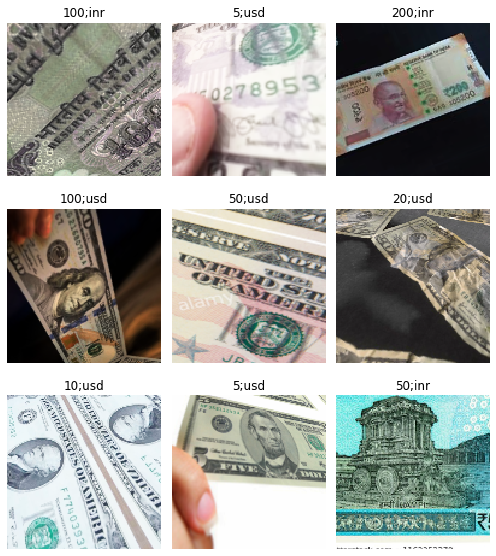

In [0]:
data.show_batch(rows=3, figsize=(7,8))

epoch,train_loss,valid_loss,accuracy_thresh,fbeta,time
0,0.264192,0.250695,0.875000,0.792656,00:58
1,0.260586,0.252459,0.870455,0.794320,01:01
2,0.265647,0.263168,0.856818,0.777129,01:07
3,0.271198,0.243352,0.886364,0.798589,00:59
4,0.267079,0.238218,0.884091,0.796523,00:55


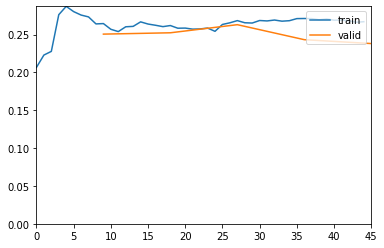

In [0]:
learn.fit_one_cycle(5, slice(lr),callbacks=ShowGraph(learn))

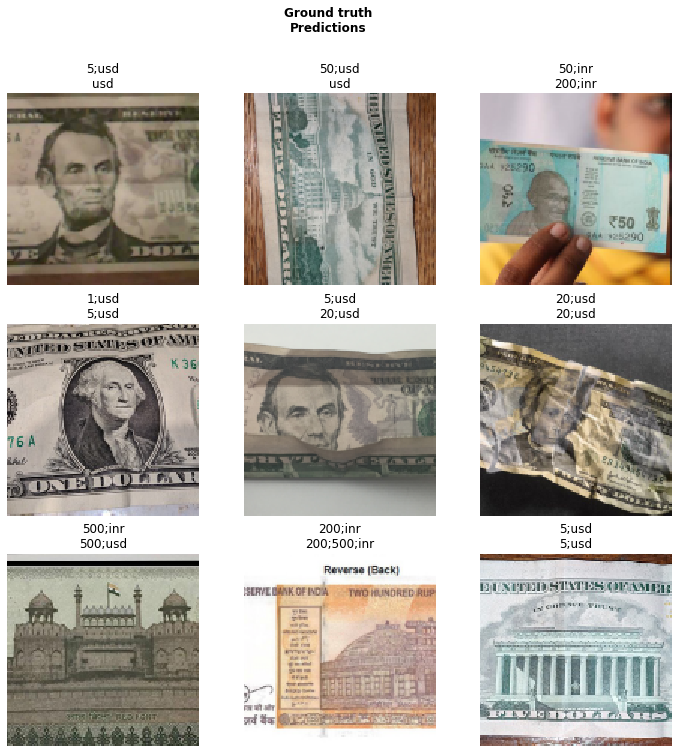

In [0]:
learn.show_results(rows=3)

In [0]:
interp = ClassificationInterpretation.from_learner(learn)

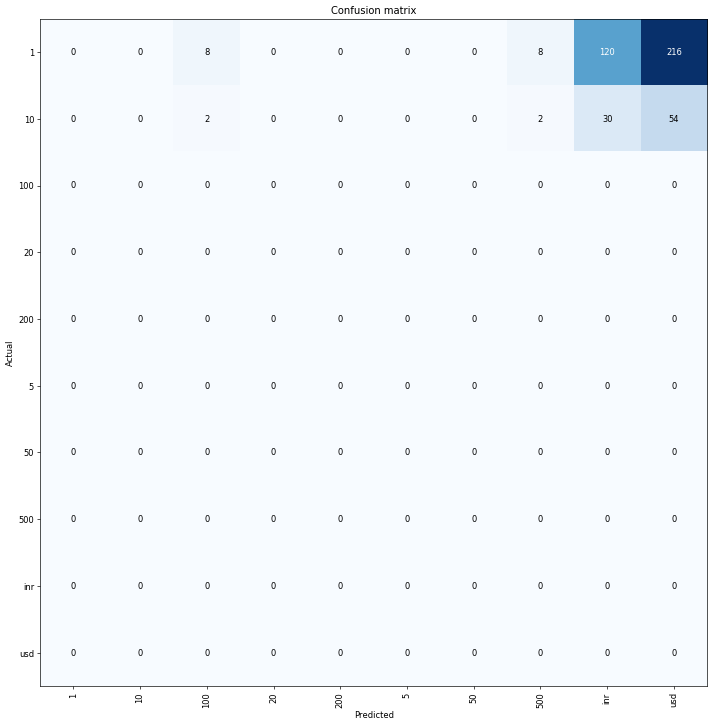

In [0]:
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [0]:
#less errors now

In [0]:
learn.save('stage-1-rn18')

In [0]:
learn.unfreeze()

In [0]:
#fine tune model

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


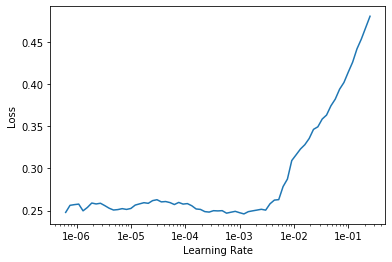

In [0]:
learn.lr_find()
learn.recorder.plot()

epoch,train_loss,valid_loss,accuracy_thresh,fbeta,time
0,0.267731,0.247029,0.875000,0.782060,01:00
1,0.251496,0.234336,0.884091,0.788259,00:58
2,0.239748,0.230417,0.886364,0.788947,00:56
3,0.248427,0.228368,0.888636,0.800311,00:55
4,0.245377,0.226818,0.890909,0.801344,00:56


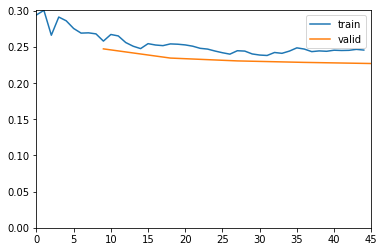

In [0]:
lr=1e-4
learn.fit_one_cycle(5, slice(1e-5, lr/5),callbacks=ShowGraph(learn))

In [0]:
learn.save('stage-2-rn18')

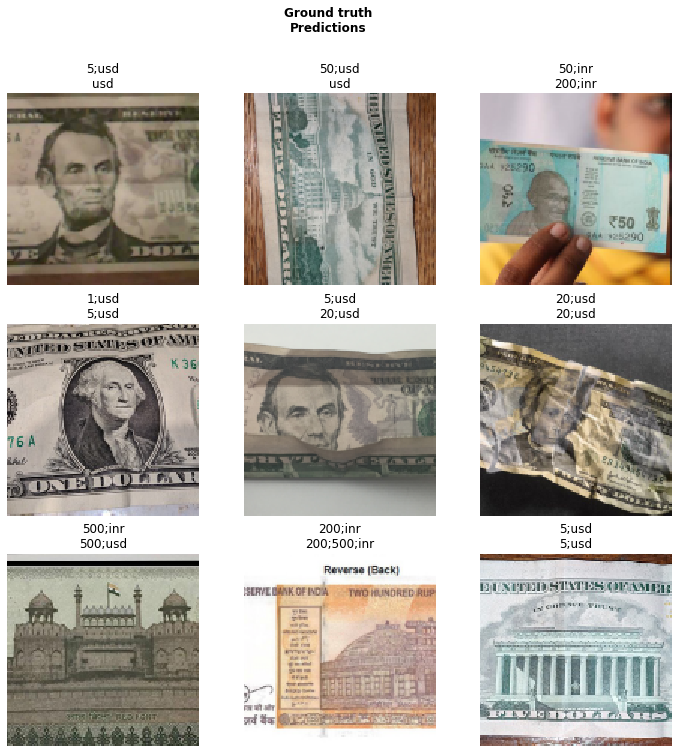

In [0]:
learn.show_results(rows=3)

In [0]:
interp = ClassificationInterpretation.from_learner(learn)


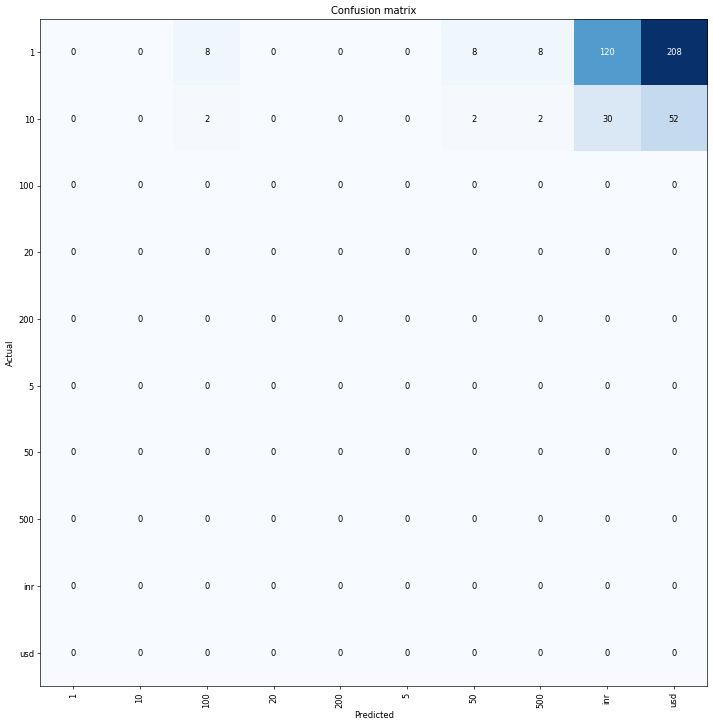

In [0]:
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [0]:
#saved to ensure if overfit, then can revert

epoch,train_loss,valid_loss,accuracy_thresh,fbeta,time
0,0.265136,0.224641,0.902273,0.816230,01:12
1,0.240825,0.221218,0.888636,0.806853,01:09
2,0.235962,0.213205,0.895454,0.812098,01:11
3,0.239416,0.211536,0.886364,0.806244,01:09
4,0.245300,0.212837,0.893182,0.811065,01:09
5,0.239282,0.208151,0.895454,0.819904,01:12
6,0.243326,0.209204,0.893182,0.818641,01:09
7,0.240605,0.203987,0.895454,0.819904,00:56
8,0.238545,0.202155,0.895454,0.818871,00:55
9,0.239996,0.200109,0.893182,0.810606,00:57


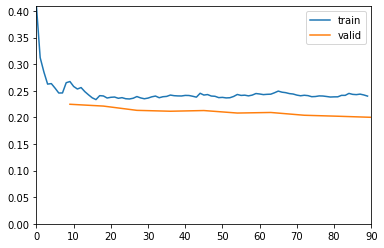

In [0]:
learn.fit_one_cycle(10, slice(1e-5, lr/5),callbacks=ShowGraph(learn))

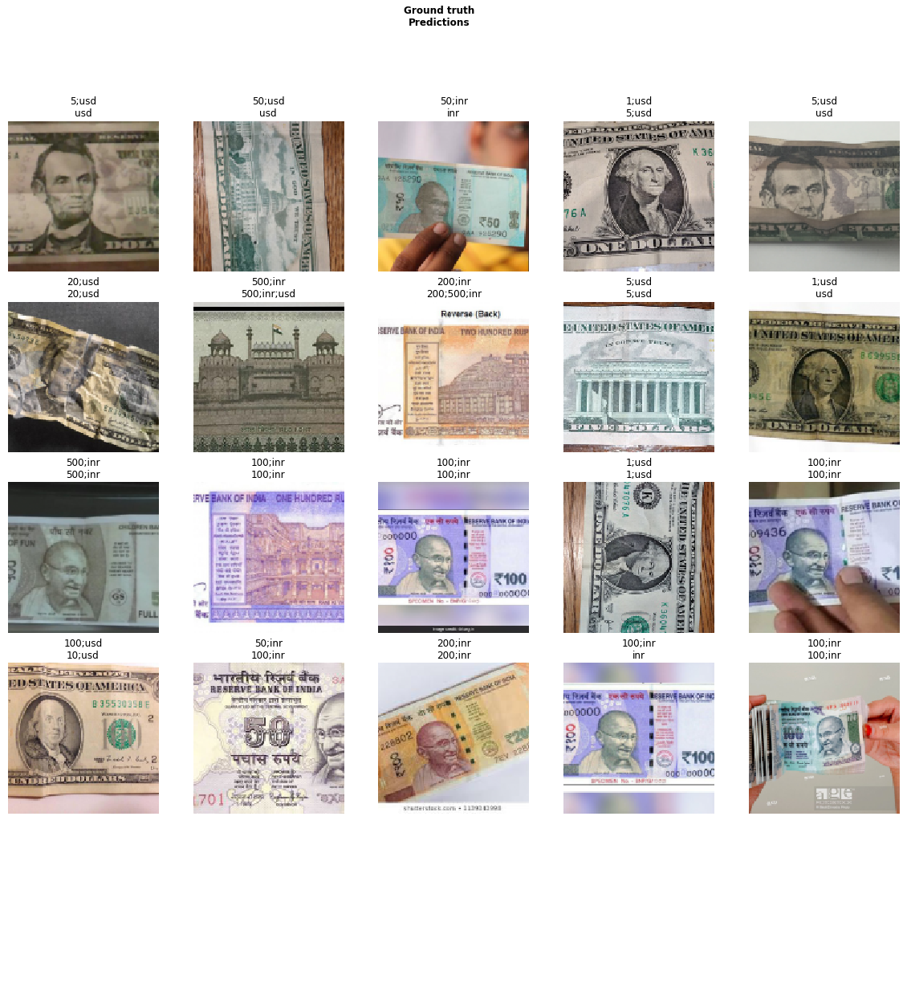

In [0]:
learn.show_results()

In [0]:
gc.collect()
torch.cuda.empty_cache()

In [0]:
size,bs=256,10/4
data=get_data(size,bs)

In [0]:
interp = ClassificationInterpretation.from_learner(learn)

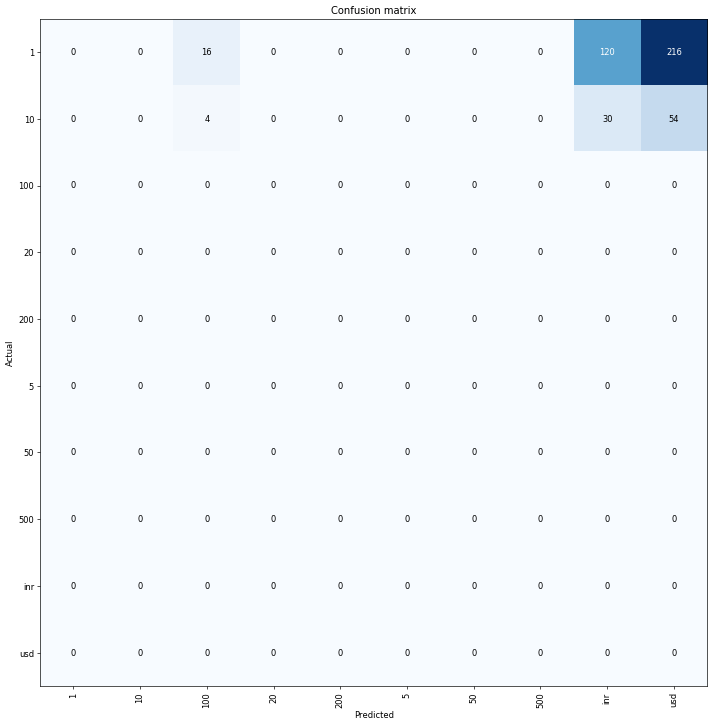

In [0]:
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [0]:
learn.save('stage-3-resnet18')

In [0]:
learn.freeze()

In [0]:
from fastai.widgets import *

In [0]:
db = (ImageList.from_folder(path)
                   .split_none()
                   .label_from_folder()
                   .transform(get_transforms(), size=224)
                   .databunch()
     )

In [0]:
learn_cln.load('stage-2-resnet18')

NameError: name 'learn_cln' is not defined

In [0]:
learn_cln = cnn_learner(db, models.resnet18, metrics=error_rate)

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


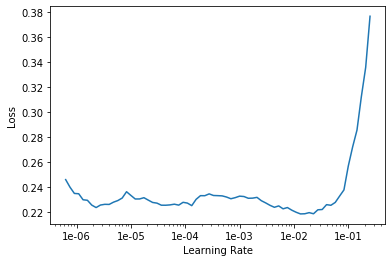

In [0]:
learn.lr_find()
learn.recorder.plot()

epoch,train_loss,valid_loss,accuracy_thresh,fbeta,time
0,0.255633,0.220552,0.884091,0.772153,01:35
1,0.231711,0.203368,0.893182,0.795110,01:37
2,0.233957,0.197548,0.893182,0.809688,01:31
3,0.224338,0.187987,0.902273,0.832759,01:30
4,0.211255,0.174681,0.906818,0.835744,01:22
5,0.208457,0.165526,0.911364,0.854454,01:20
6,0.209210,0.163096,0.911364,0.846878,01:24
7,0.208200,0.161766,0.918182,0.853076,01:22
8,0.207443,0.167774,0.906818,0.828283,01:29
9,0.203684,0.163386,0.909091,0.844812,01:36


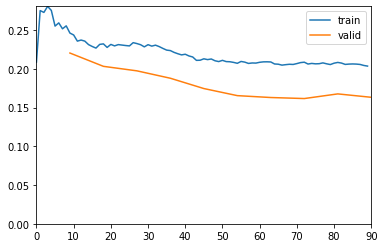

In [0]:
learn.unfreeze()
lr=1e-4
learn.fit_one_cycle(10, slice(1e-5, lr/5),callbacks=ShowGraph(learn))

In [0]:
learn.load('stage-3-resnet18')

Learner(data=ImageDataBunch;

Train: LabelList (180 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: MultiCategoryList
inr;100,inr;100,inr;100,inr;100,inr;100
Path: C:\Users\Admin\Desktop\imgs;

Valid: LabelList (44 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: MultiCategoryList
usd;5,usd;50,inr;50,usd;1,usd;5
Path: C:\Users\Admin\Desktop\imgs;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d

epoch,train_loss,valid_loss,accuracy_thresh,fbeta,time
0,0.218470,0.221366,0.888636,0.775482,01:27
1,0.233077,0.213472,0.893182,0.786272,02:39
2,0.237817,0.209722,0.890909,0.793848,02:52
3,0.237161,0.205608,0.890909,0.793848,02:37
4,0.245069,0.204259,0.888636,0.791781,01:16
5,0.245033,0.207540,0.888636,0.792814,01:20
6,0.237356,0.204211,0.893182,0.803948,01:17
7,0.234187,0.203988,0.893182,0.804178,01:17
8,0.232956,0.203043,0.893182,0.803145,01:17
9,0.234956,0.207971,0.888636,0.800046,01:17


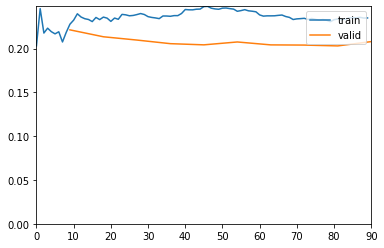

In [0]:
learn.unfreeze()
lr=1e-5
learn.fit_one_cycle(10, max_lr=slice(1e-6, lr/5),callbacks=ShowGraph(learn))

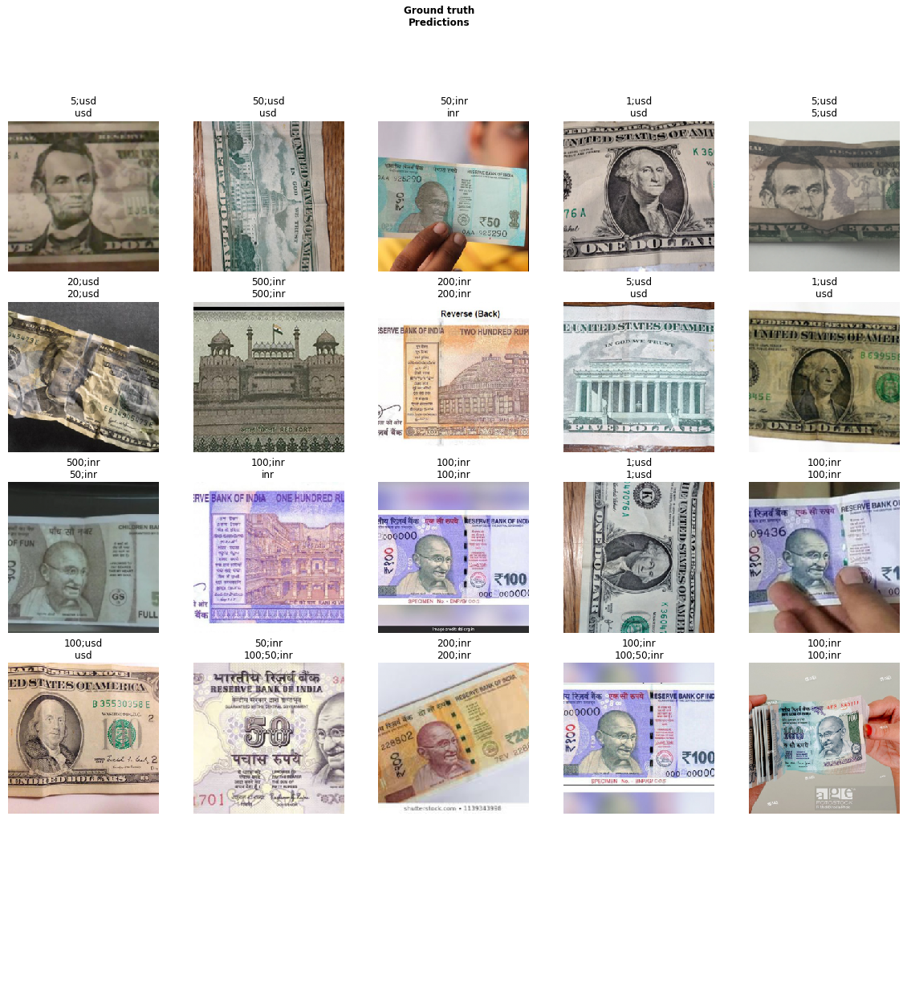

In [0]:
learn.show_results()

In [0]:
interp = ClassificationInterpretation.from_learner(learn);

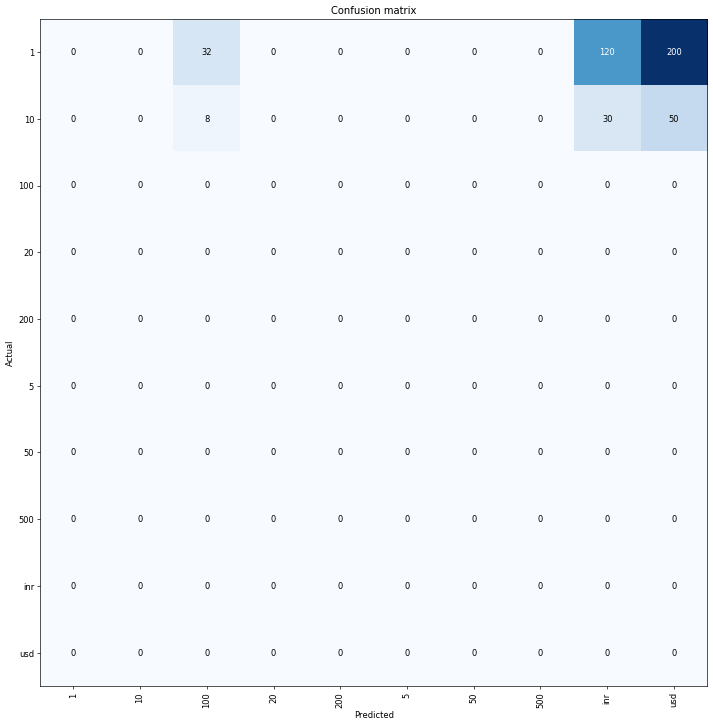

In [0]:
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [0]:
imgPath=src.train.items[0]
img = open_image(imgPath)
pred=learn.predict(img)
probabilities=[ '%.2f' % float(100*elem) for elem in pred[2] ]
dict(zip(classes,probabilities))

NameError: name 'classes' is not defined

In [0]:
imgPath=src.train.items[0]
img = open_image(imgPath)
pred=learn.predict(img)
probabilities=[ '%.2f' % float(100*elem) for elem in pred[2] ]
dict(zip(data.classes,probabilities))

{'1': '0.65',
 '10': '3.99',
 '100': '96.51',
 '20': '1.43',
 '200': '0.00',
 '5': '2.65',
 '50': '31.82',
 '500': '1.25',
 'inr': '86.57',
 'usd': '13.42'}

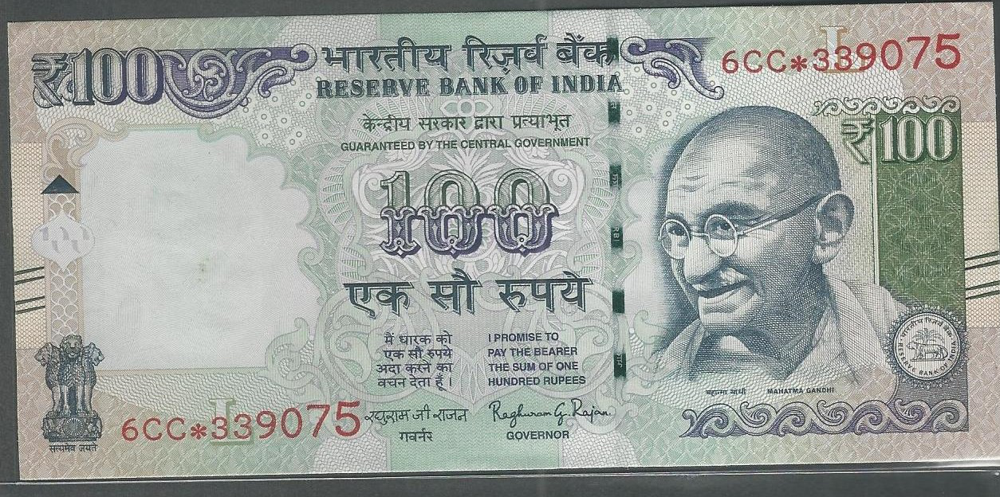

In [0]:
img

In [0]:
imgPath=src.train.items[1]
img = open_image(imgPath)
pred=learn.predict(img)
probabilities=[ '%.2f' % float(100*elem) for elem in pred[2] ]
dict(zip(data.classes,probabilities))

{'1': '0.02',
 '10': '0.05',
 '100': '83.42',
 '20': '0.37',
 '200': '0.01',
 '5': '0.59',
 '50': '34.70',
 '500': '0.21',
 'inr': '98.69',
 'usd': '1.26'}

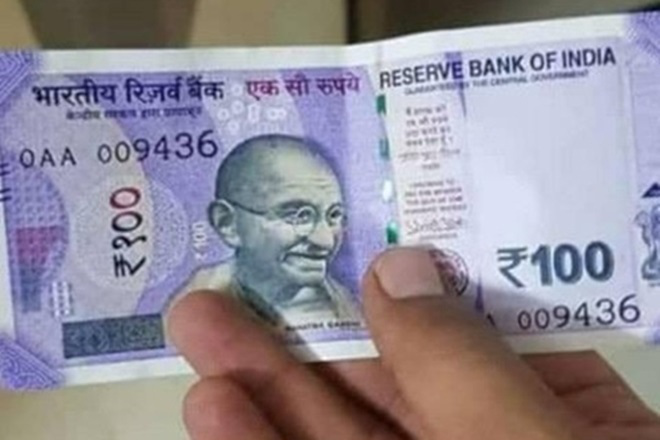

In [0]:
img

In [0]:
imgPath=src.train.items[3]
img = open_image(imgPath)
pred=learn.predict(img)
probabilities=[ '%.2f' % float(100*elem) for elem in pred[2] ]
dict(zip(data.classes,probabilities))

{'1': '0.05',
 '10': '0.50',
 '100': '81.06',
 '20': '0.31',
 '200': '0.12',
 '5': '0.24',
 '50': '6.39',
 '500': '9.67',
 'inr': '99.96',
 'usd': '0.04'}

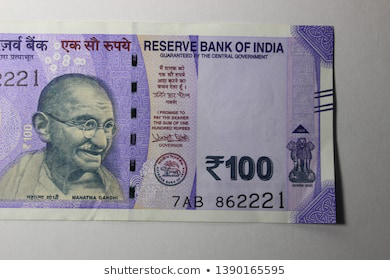

In [0]:
img

In [0]:
imgPath=src.train.items[10]
img = open_image(imgPath)
pred=learn.predict(img)
probabilities=[ '%.2f' % float(100*elem) for elem in pred[2] ]
dict(zip(data.classes,probabilities))

{'1': '0.62',
 '10': '3.04',
 '100': '71.69',
 '20': '0.71',
 '200': '0.12',
 '5': '1.27',
 '50': '62.73',
 '500': '0.75',
 'inr': '80.92',
 'usd': '16.23'}

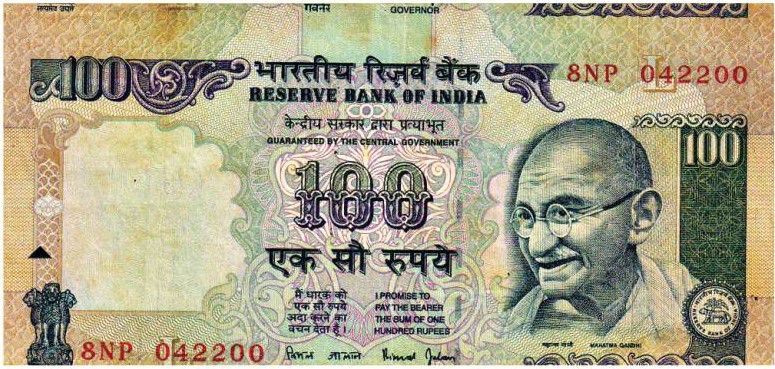

In [0]:
img

In [0]:
img = open_image(path/'imgs'/'inr'/'50'/'0.jpg')

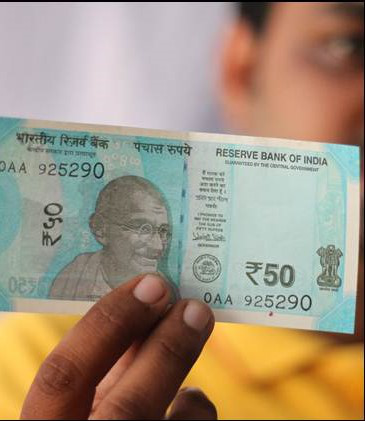

In [0]:
img


In [0]:
pred=learn.predict(img)
probabilities=[ '%.2f' % float(100*elem) for elem in pred[2] ]
dict(zip(data.classes,probabilities))

{'1': '0.72',
 '10': '1.14',
 '100': '12.19',
 '20': '1.52',
 '200': '0.93',
 '5': '0.58',
 '50': '36.10',
 '500': '1.01',
 'inr': '96.84',
 'usd': '10.94'}

In [0]:
img = open_image(path/'trial'/'0.jpeg')

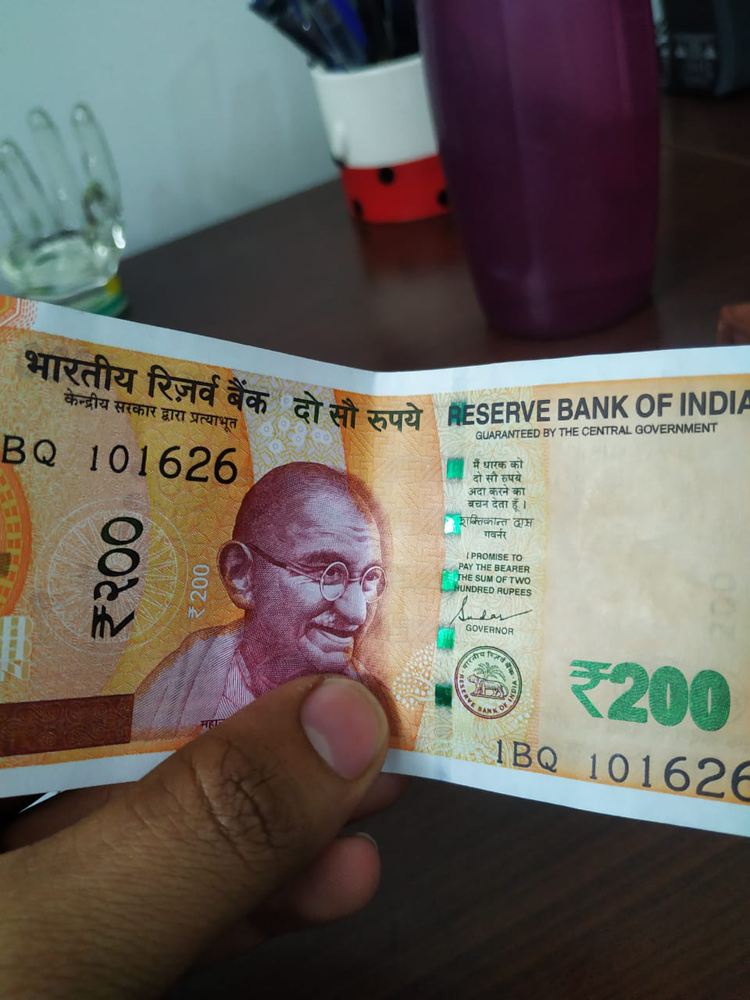

In [0]:
img

In [0]:
pred=learn.predict(img)
probabilities=[ '%.2f' % float(100*elem) for elem in pred[2] ]
dict(zip(data.classes,probabilities))

{'1': '0.01',
 '10': '0.04',
 '100': '16.96',
 '20': '2.85',
 '200': '2.35',
 '5': '0.34',
 '50': '17.49',
 '500': '0.03',
 'inr': '99.44',
 'usd': '3.37'}

In [0]:
img = open_image(path/'trial'/'1.jpeg')

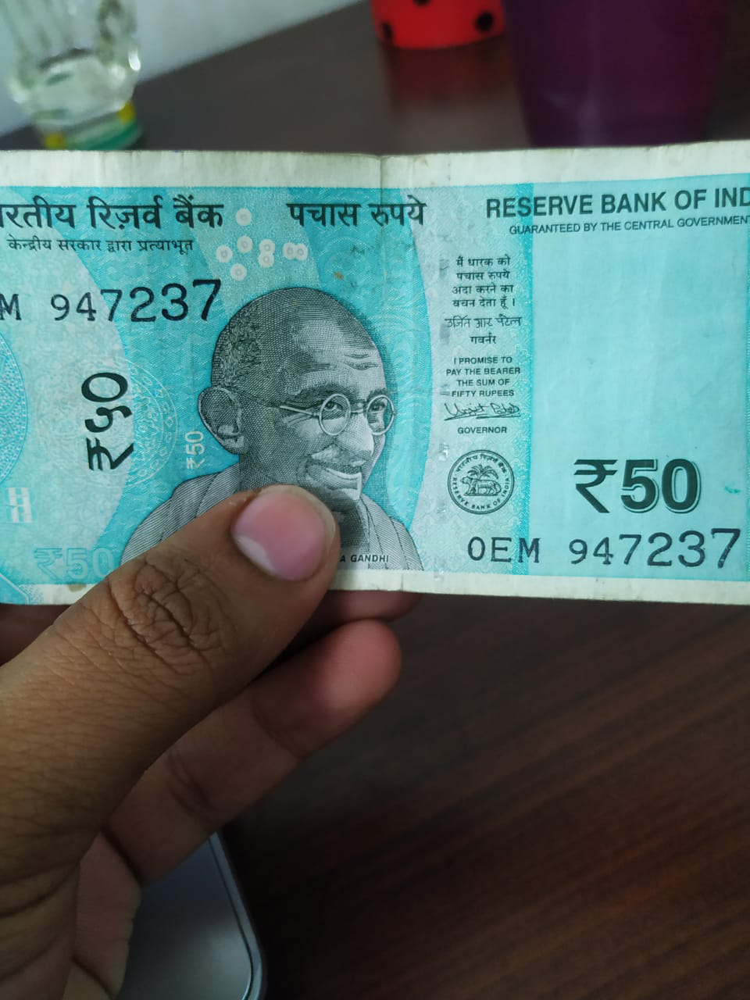

In [0]:
img

In [0]:
pred=learn.predict(img)
probabilities=[ '%.2f' % float(100*elem) for elem in pred[2] ]
dict(zip(data.classes,probabilities))

{'1': '0.37',
 '10': '0.50',
 '100': '17.68',
 '20': '0.34',
 '200': '0.02',
 '5': '1.23',
 '50': '63.79',
 '500': '0.69',
 'inr': '97.78',
 'usd': '2.49'}

In [0]:
img = open_image(path/'trial'/'2.jpeg')

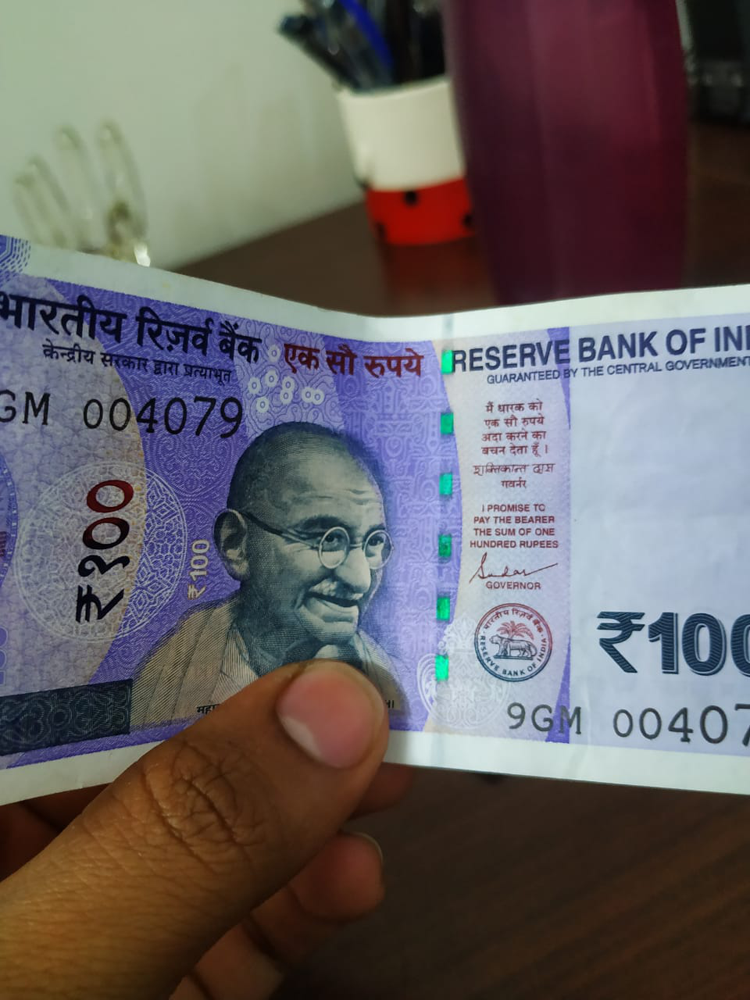

In [0]:
img

In [0]:
pred=learn.predict(img)
probabilities=[ '%.2f' % float(100*elem) for elem in pred[2] ]
dict(zip(data.classes,probabilities))

{'1': '0.01',
 '10': '0.07',
 '100': '82.38',
 '20': '0.65',
 '200': '0.06',
 '5': '0.10',
 '50': '46.69',
 '500': '0.10',
 'inr': '99.77',
 'usd': '0.52'}

In [0]:
img = open_image(path/'trial'/'3.jpeg')

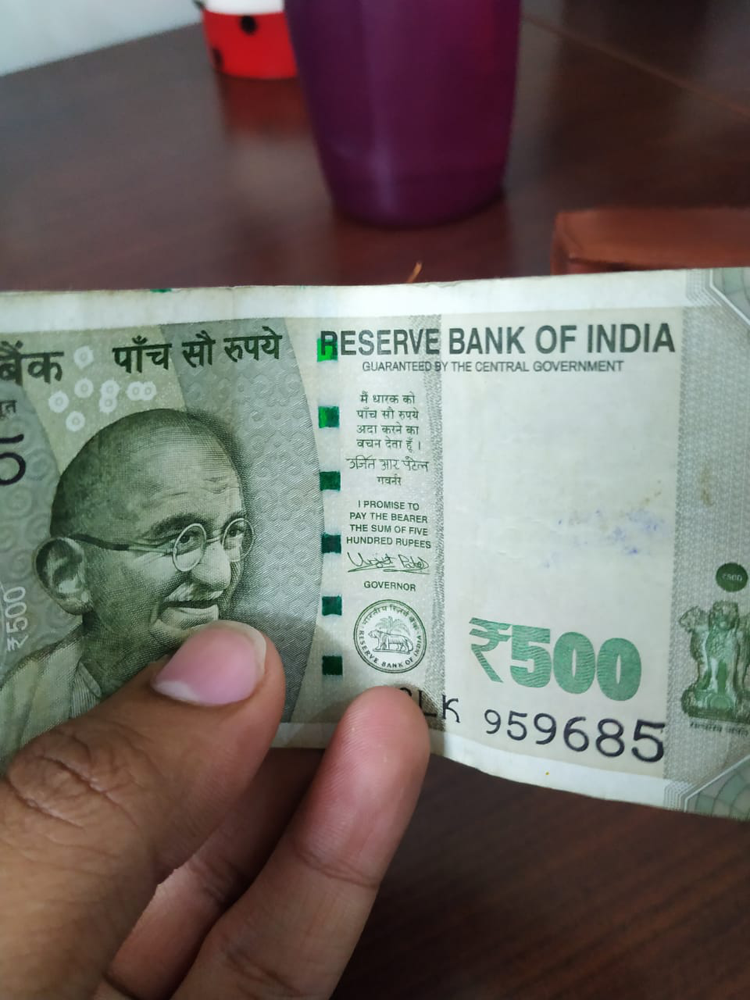

In [0]:
img

In [0]:
pred=learn.predict(img)
probabilities=[ '%.2f' % float(100*elem) for elem in pred[2] ]
dict(zip(data.classes,probabilities))

{'1': '0.90',
 '10': '0.53',
 '100': '39.02',
 '20': '4.27',
 '200': '0.03',
 '5': '0.16',
 '50': '33.98',
 '500': '19.97',
 'inr': '94.47',
 'usd': '8.87'}

In [0]:
learn.load('stage-2-rn18')

Learner(data=ImageDataBunch;

Train: LabelList (180 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: MultiCategoryList
inr;100,inr;100,inr;100,inr;100,inr;100
Path: C:\Users\Admin\Desktop\imgs;

Valid: LabelList (44 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: MultiCategoryList
usd;5,usd;50,inr;50,usd;1,usd;5
Path: C:\Users\Admin\Desktop\imgs;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d

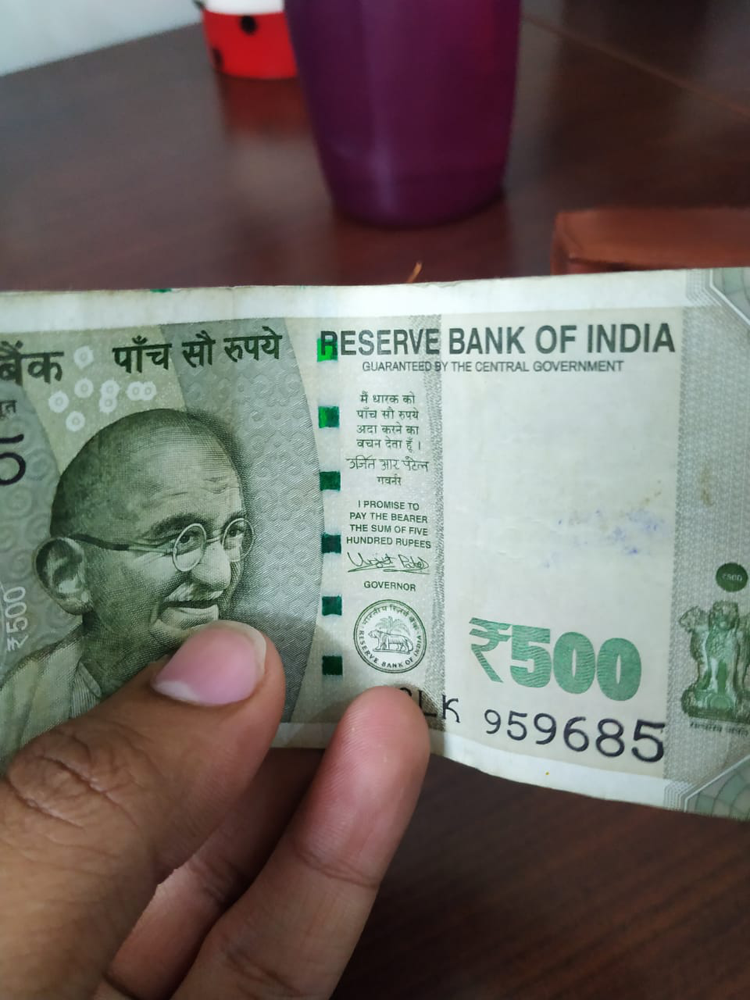

In [0]:
img

In [0]:
pred=learn.predict(img)
probabilities=[ '%.2f' % float(100*elem) for elem in pred[2] ]
dict(zip(data.classes,probabilities))

{'1': '1.17',
 '10': '0.68',
 '100': '46.72',
 '20': '6.29',
 '200': '0.13',
 '5': '0.93',
 '50': '28.80',
 '500': '11.92',
 'inr': '78.08',
 'usd': '16.82'}

In [0]:
img = open_image(path/'trial'/'7.jpg')

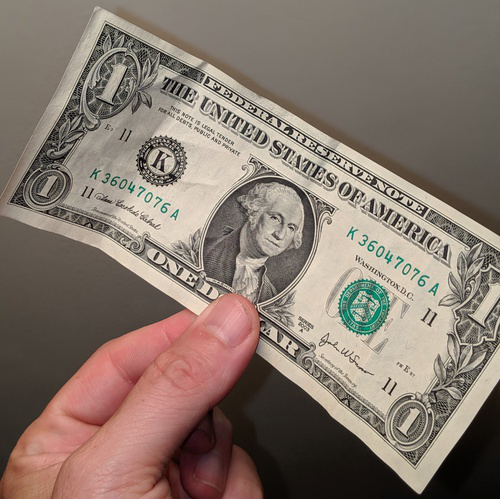

In [0]:
img

In [0]:
pred=learn.predict(img)
probabilities=[ '%.2f' % float(100*elem) for elem in pred[2] ]
dict(zip(data.classes,probabilities))

{'1': '23.76',
 '10': '5.10',
 '100': '5.38',
 '20': '3.82',
 '200': '0.19',
 '5': '35.51',
 '50': '22.43',
 '500': '0.58',
 'inr': '4.39',
 'usd': '92.69'}